# 🚗 Projeto de Análise de Dados - Indústria Automobilística

Este notebook foi desenvolvido como parte da **Residência Tecnológica** em parceria com a **NTT DATA**, com o objetivo de realizar análises avançadas sobre os dados operacionais de uma indústria automobilística.

Utilizamos a abordagem de **Arquitetura em Camadas Medalhão** (Medallion Architecture), estruturando o processamento dos dados em camadas bem definidas, que garantem maior qualidade, organização e rastreabilidade nas transformações.

## ⚙️ Engenharia de dados:

## 🥉  Camada Bronze - Ingestão bruta dos dados

Nesta etapa, realizamos a ingestão padrão dos dados utilizando a interface gráfica (UX) do **Databricks**. Como primeira configuração, definimos que a **primeira linha dos arquivos representa o cabeçalho** (header) das tabelas, garantindo o correto mapeamento das colunas. 

O objetivo da **Camada Bronze** é armazenar os dados de forma bruta, exatamente como foram recebidos, garantindo integridade e rastreabilidade para futuras transformações e auditorias.


### Exibindo que as tabelas foram importadas com sucesso para dentro do ambiente:

####Tabela de Pedidos:

In [0]:
%sql
SELECT * FROM hive_metastore.default.pedidos


nr_pedido,nr_linha_pedido,data_pedido,nome_vendedor,estado,cidade,nome_produto,cod_produto,grupo_produto,qtde_produtos,preco_unitario,valor_imposto,valor_total_linha,status_pedido
PED000001,LIN000001,2025-05-02,Pedro Lima,MG,Belo Horizonte,Pneu,P004,Rodas,8,400.0,576.0,3200.0,cancelado
PED000002,LIN000002,2025-03-28,Carlos Silva,SP,São Paulo,Pneu,P004,Rodas,13,400.0,936.0,5200.0,convertido
PED000003,LIN000003,2023-07-04,Mariana Costa,RS,Porto Alegre,Bateria,P003,Elétrica,19,300.0,1026.0,5700.0,convertido
PED000004,LIN000004,2024-05-26,Mariana Costa,RS,Porto Alegre,Bateria,P003,Elétrica,5,300.0,270.0,1500.0,pendente
PED000005,LIN000005,2023-08-05,Carlos Silva,SP,São Paulo,Filtro de óleo,P001,Motor,12,50.0,108.0,600.0,convertido
PED000006,LIN000006,2023-12-04,Lucas Almeida,PR,Curitiba,Bateria,P003,Elétrica,12,300.0,648.0,3600.0,cancelado
PED000007,LIN000007,2024-12-02,Carlos Silva,SP,São Paulo,Filtro de óleo,P001,Motor,5,50.0,45.0,250.0,cancelado
PED000008,LIN000008,2023-08-08,Pedro Lima,MG,Belo Horizonte,Filtro de óleo,P001,Motor,3,50.0,27.0,150.0,convertido
PED000009,LIN000009,2025-01-29,Lucas Almeida,PR,Curitiba,Velas de ignição,P005,Motor,10,80.0,144.0,800.0,convertido
PED000010,LIN000010,2022-11-06,Carlos Silva,SP,São Paulo,Velas de ignição,P005,Motor,9,80.0,129.6,720.0,cancelado


####Tabela de Notas Fiscais:

In [0]:
%sql
SELECT * FROM notas_fiscais

nr_nota_fiscal,nr_linha_nf,nr_pedido_referencia,nome_vendedor,data_emissao_nf,data_vencimento_nf,cod_produto,nome_produto,qtde_produto,valor_total_produto,imposto_produto
NF000001,LIN000001,PED000001,Pedro Lima,2024-10-27,2024-12-04,P005,Velas de ignição,12,960.0,172.79999999999998
NF000002,LIN000002,PED000002,Mariana Costa,2024-09-19,2024-10-04,P002,Pastilha de freio,14,1680.0,302.4
NF000003,LIN000003,PED000003,Mariana Costa,2023-10-06,2023-05-21,P002,Pastilha de freio,4,480.0,86.39999999999999
NF000004,LIN000004,PED000004,Ana Souza,2024-09-04,2023-07-03,P004,Pneu,20,8000.0,1440.0
NF000005,LIN000005,PED000005,Pedro Lima,2022-08-08,2023-07-05,P003,Bateria,18,5400.0,972.0
NF000006,LIN000006,PED000006,Carlos Silva,2024-05-10,2023-03-23,P004,Pneu,5,2000.0,360.0
NF000007,LIN000007,PED000007,Pedro Lima,2024-01-27,2025-05-24,P001,Filtro de óleo,10,500.0,90.0
NF000008,LIN000008,PED000008,Lucas Almeida,2024-02-11,2023-11-14,P005,Velas de ignição,14,1120.0,201.6
NF000009,LIN000009,PED000009,Ana Souza,2024-07-05,2025-05-13,P005,Velas de ignição,8,640.0,115.2
NF000010,LIN000010,PED000010,Ana Souza,2024-03-21,2023-02-21,P004,Pneu,10,4000.0,720.0


#### Pedidos:

In [0]:
#Leitura dentro da tabela que esta no nosso hive_metastore (bronze): 

df_bronze = spark.table("hive_metastore.default.pedidos")

In [0]:
#Leitura dentro da tabela que esta no nosso hive_metastore (bronze): 

df_bronze = spark.table("hive_metastore.default.notas_fiscais")

### 🥈 Camada Silver: Primeiras transformações dos dados

Nesta etapa realizamos as **primeiras conversões e tratamentos** sobre a base que anteriormente estava na forma **bruta (default)**. O objetivo da **Camada Silver** é padronizar, limpar e preparar os dados para análises mais avançadas, garantindo maior qualidade e consistência.

#### Pedidos (silver)

In [0]:
from pyspark.sql.functions import col, to_date, regexp_replace
from pyspark.sql.types import DoubleType

# ✅ Leitura da tabela do metastore
df_bronze = spark.table("default.pedidos")

# 🔧 Conversão de colunas numéricas
colunas_numericas = [
    "qtde_produtos", 
    "preco_unitario", 
    "valor_imposto", 
    "valor_total_linha"
]

for coluna in colunas_numericas:
    df_bronze = df_bronze.withColumn(
        coluna, regexp_replace(col(coluna), ",", ".").cast(DoubleType())
    )

# 🔧 Conversão de datas
df_bronze = df_bronze.withColumn(
    "data_pedido", to_date(col("data_pedido"), "yyyy-MM-dd")
)

# 🗑️ Remoção de duplicatas e validação de chaves
df_silver = (df_bronze
    .dropDuplicates()
    .na.drop(subset=["nr_pedido", "cod_produto", "data_pedido"])
)

# 💾 Escrita na camada Silver (Delta Lake)
silver_path = "/mnt/silver/pedidos"

df_silver.write.format("delta") \
    .mode("overwrite") \
    .option("overwriteSchema", "true") \
    .saveAsTable("silver.pedidos_silver")



In [0]:
%sql
SELECT * FROM hive_metastore.silver.pedidos_silver

nr_pedido,nr_linha_pedido,data_pedido,nome_vendedor,estado,cidade,nome_produto,cod_produto,grupo_produto,qtde_produtos,preco_unitario,valor_imposto,valor_total_linha,status_pedido
PED000157,LIN000157,2024-04-04,Pedro Lima,MG,Belo Horizonte,Velas de ignição,P005,Motor,14.0,80.0,201.6,1120.0,cancelado
PED000332,LIN000332,2024-04-14,Lucas Almeida,PR,Curitiba,Pneu,P004,Rodas,4.0,400.0,288.0,1600.0,cancelado
PED000589,LIN000589,2025-02-10,Pedro Lima,MG,Belo Horizonte,Velas de ignição,P005,Motor,4.0,80.0,57.6,320.0,convertido
PED000948,LIN000948,2022-12-30,Lucas Almeida,PR,Curitiba,Pneu,P004,Rodas,8.0,400.0,576.0,3200.0,cancelado
PED001006,LIN001006,2023-12-25,Carlos Silva,SP,São Paulo,Bateria,P003,Elétrica,5.0,300.0,270.0,1500.0,convertido
PED001248,LIN001248,2022-12-27,Ana Souza,RJ,Rio de Janeiro,Filtro de óleo,P001,Motor,14.0,50.0,126.0,700.0,convertido
PED001372,LIN001372,2022-09-08,Mariana Costa,RS,Porto Alegre,Bateria,P003,Elétrica,19.0,300.0,1026.0,5700.0,cancelado
PED001377,LIN001377,2024-08-01,Ana Souza,RJ,Rio de Janeiro,Filtro de óleo,P001,Motor,14.0,50.0,126.0,700.0,pendente
PED001468,LIN001468,2022-10-26,Pedro Lima,MG,Belo Horizonte,Pneu,P004,Rodas,14.0,400.0,1008.0,5600.0,cancelado
PED001760,LIN001760,2023-12-03,Carlos Silva,SP,São Paulo,Pneu,P004,Rodas,8.0,400.0,576.0,3200.0,pendente


#### Notas Fiscais (Silver)

In [0]:
from pyspark.sql.functions import col, to_date, regexp_replace
from pyspark.sql.types import DoubleType

# ===============================
# 🔸 Leitura da tabela Bronze
# ===============================
df_bronze_notas = spark.table("default.notas_fiscais")

# ===============================
# 🔧 Tratamento da tabela NOTAS FISCAIS
# ===============================

# Conversão de colunas numéricas
colunas_numericas = [
    "qtde_produto", "valor_total_produto", "imposto_produto"
]

for coluna in colunas_numericas:
    df_bronze_notas = df_bronze_notas.withColumn(
        coluna,
        regexp_replace(col(coluna), ",", ".").cast(DoubleType())
    )

# Conversão de colunas de data
df_bronze_notas = (df_bronze_notas
    .withColumn("data_emissao_nf", to_date(col("data_emissao_nf"), "yyyy-MM-dd"))
    .withColumn("data_vencimento_nf", to_date(col("data_vencimento_nf"), "yyyy-MM-dd"))
)

# Tratamento geral: remoção de duplicados e nulos críticos
df_silver_notas = (df_bronze_notas
    .dropDuplicates()
    .na.drop(subset=["nr_nota_fiscal", "cod_produto", "data_emissao_nf"])
)

# ===============================
# 💾 Escrita no Hive Metastore Silver
# ===============================
df_silver_notas.write.format("delta") \
    .mode("overwrite") \
    .option("overwriteSchema", "true") \
    .saveAsTable("silver.notas_fiscais_silver")

# ===============================
# ✅ Validação da tabela Silver
# ===============================
display(spark.table("silver.notas_fiscais_silver"))


nr_nota_fiscal,nr_linha_nf,nr_pedido_referencia,nome_vendedor,data_emissao_nf,data_vencimento_nf,cod_produto,nome_produto,qtde_produto,valor_total_produto,imposto_produto
NF000070,LIN000070,PED000070,Mariana Costa,2023-11-23,2024-06-22,P002,Pastilha de freio,7.0,840.0,151.2
NF000243,LIN000243,PED000243,Lucas Almeida,2023-12-21,2023-09-23,P004,Pneu,14.0,5600.0,1008.0
NF000300,LIN000300,PED000300,Ana Souza,2023-06-15,2025-03-27,P003,Bateria,11.0,3300.0,594.0
NF000364,LIN000364,PED000364,Ana Souza,2024-03-31,2022-09-26,P005,Velas de ignição,6.0,480.0,86.39999999999999
NF000416,LIN000416,PED000416,Ana Souza,2025-02-05,2023-01-31,P002,Pastilha de freio,7.0,840.0,151.2
NF000766,LIN000766,PED000766,Pedro Lima,2025-02-09,2022-10-31,P003,Bateria,16.0,4800.0,864.0
NF001579,LIN001579,PED001579,Ana Souza,2022-06-03,2023-04-12,P002,Pastilha de freio,11.0,1320.0,237.6
NF001769,LIN001769,PED001769,Pedro Lima,2025-03-26,2022-07-08,P004,Pneu,2.0,800.0,144.0
NF002197,LIN002197,PED002197,Ana Souza,2024-01-28,2024-09-20,P001,Filtro de óleo,14.0,700.0,126.0
NF002275,LIN002275,PED002275,Carlos Silva,2023-01-04,2024-04-24,P001,Filtro de óleo,11.0,550.0,99.0


### 🥇 Camada Gold: Modelagem e geração de visualizações

Na **Camada Gold**, realizamos a **modelagem final dos dados**, estruturando datasets prontos para consumo analítico.

Também é nesta etapa que ocorre a **geração de visualizações**, como gráficos e dashboards, utilizando bibliotecas especializadas para análise exploratória e apoio à tomada de decisão.

O foco da **Gold** é disponibilizar dados confiáveis, limpos e enriquecidos, facilitando insights e análises avançadas.

#### Importação de bibliotecas

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker
from pyspark.sql import functions as F
from pyspark.sql.functions import col
from pyspark.sql.window import Window
import pandas as pd
import plotly.express as px
import plotly.io as pio

# ===============================
# 🎨 Configuração de estilo dos gráficos
# ===============================
plt.style.use('ggplot')
sns.set_palette("husl")

In [0]:
# Leitura da tabela pedidos_silver
pedidos_silver = spark.table("silver.pedidos_silver")

In [0]:
# Leitura da tabela notas_fiscais_silver
notas_fiscais_silver = spark.table("silver.notas_fiscais_silver")

#### Produtos mais vendidos por faturamento

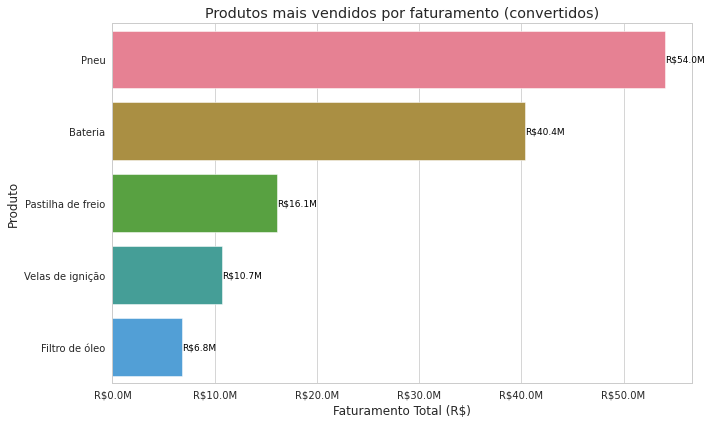

In [0]:
# ===============================
# 🔸 Filtragem de pedidos convertidos
# ===============================
pedidos_convertidos = pedidos_silver.filter(col("status_pedido") == "convertido")

# ===============================
# 📊 Agrupamento e cálculo do faturamento total por produto
# ===============================
produtos_mais_vendidos = (pedidos_convertidos
    .groupBy("nome_produto")
    .agg(F.sum("valor_total_linha").alias("faturamento_total"))
    .orderBy(F.desc("faturamento_total"))
)

# ===============================
# 🔄 Conversão para Pandas para visualização
# ===============================
produtos_mais_vendidos_pd = produtos_mais_vendidos.toPandas()

# ===============================
# 🎨 Plotagem do gráfico de barras
# ===============================
plt.figure(figsize=(10, 6))
ax = sns.barplot(x="faturamento_total", y="nome_produto", data=produtos_mais_vendidos_pd)

# Configuração do título e dos eixos
plt.title("Produtos mais vendidos por faturamento (convertidos)")
plt.xlabel("Faturamento Total (R$)")
plt.ylabel("Produto")

# ===============================
# 🔧 Formatação do eixo X para valores em milhões (R$)
# ===============================
def milhoes_br(x, pos):
    return f'R${x / 1_000_000:.1f}M'

ax.xaxis.set_major_formatter(ticker.FuncFormatter(milhoes_br))

# ===============================
# 🔢 Adição dos valores no final das barras
# ===============================
for i, (valor, produto) in enumerate(zip(produtos_mais_vendidos_pd["faturamento_total"], 
                                         produtos_mais_vendidos_pd["nome_produto"])):
    ax.text(valor, i, f'R${valor / 1_000_000:.1f}M', 
            va='center', ha='left', fontsize=9, color='black')

plt.tight_layout()
plt.show()

####Conversão de pedidos por cidade e estado

In [0]:
# ===============================
# 🔸 Filtragem de pedidos convertidos
# ===============================
pedidos_convertidos = pedidos_silver.filter(F.col("status_pedido") == "convertido")

# ===============================
# 📍 Agrupamento por estado e cidade
# ===============================
pedidos_por_local = (pedidos_convertidos
    .groupBy("estado", "cidade")
    .agg(F.count("*").alias("total_pedidos"))
    .orderBy(F.desc("total_pedidos"))
)

# ===============================
# 🔄 Conversão para Pandas e ordenação
# ===============================
pedidos_por_local_pd = pedidos_por_local.toPandas()
pedidos_por_local_pd = pedidos_por_local_pd.sort_values("total_pedidos", ascending=False)

# ===============================
# 🔧 Preparação dos dados para visualização
# ===============================
max_valor = pedidos_por_local_pd["total_pedidos"].max()
limite_x = max_valor * 1.1

def format_brl_int(valor):
    return f'{int(valor):,}'.replace(',', 'X').replace('.', ',').replace('X', '.')

pedidos_por_local_pd['total_pedidos_formatado'] = pedidos_por_local_pd['total_pedidos'].apply(format_brl_int)

tick_step = 1000
ticks = list(range(0, int(limite_x) + tick_step, tick_step))
tick_labels = [str(tick // 1000) for tick in ticks]

# ===============================
# 📊 Criação do gráfico de barras com Plotly
# ===============================
fig = px.bar(
    pedidos_por_local_pd,
    x="total_pedidos",
    y="cidade",
    color="estado",
    orientation="h",
    title="Pedidos convertidos por cidade e estado",
    text='total_pedidos_formatado'
)

fig.update_layout(
    xaxis_title="Total de pedidos (milhares)",
    yaxis_title="Cidade",
    height=600,
    xaxis=dict(
        showgrid=True,
        range=[0, limite_x],
        tickvals=ticks,
        ticktext=tick_labels,
        separatethousands=True
    ),
    yaxis=dict(
        autorange="reversed"  # inverte o eixo y
    ),
    bargap=0.3
)

fig.update_traces(
    textposition='outside',
)

# ===============================
# 💻 Exibição do gráfico
# ===============================
pio.show(fig)

####Porcentagem de status de pedido

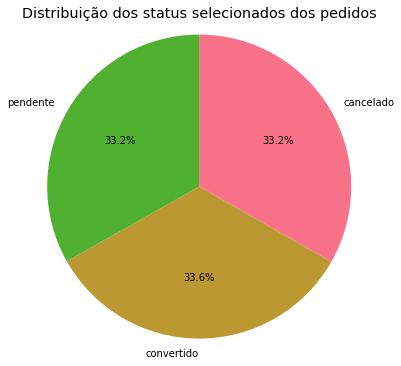

In [0]:
# ===============================
# 🔸 Definição da janela para total geral
# ===============================
window_all = Window.partitionBy()

# ===============================
# 🔍 Filtragem dos status de interesse
# ===============================
status_filtrado = pedidos_silver.filter(
    F.col("status_pedido").isin(["cancelado", "convertido", "pendente"])
)

# ===============================
# 📊 Agrupamento, contagem e cálculo do percentual
# ===============================
status_pedidos = (status_filtrado
    .groupBy("status_pedido")
    .agg(F.count("*").alias("total"))
    .withColumn("percentual", (F.col("total") / F.sum("total").over(window_all)) * 100)
)

# ===============================
# 🔄 Conversão para Pandas para plotagem
# ===============================
status_pedidos_pd = status_pedidos.toPandas()

# ===============================
# 🎨 Plotagem do gráfico de pizza
# ===============================
plt.figure(figsize=(6, 6))
plt.pie(
    status_pedidos_pd["total"],
    labels=status_pedidos_pd["status_pedido"],
    autopct='%1.1f%%',
    startangle=90,
    counterclock=False
)
plt.title("Distribuição dos status selecionados dos pedidos")
plt.axis('equal')
plt.show()


####Ranking de vendedores

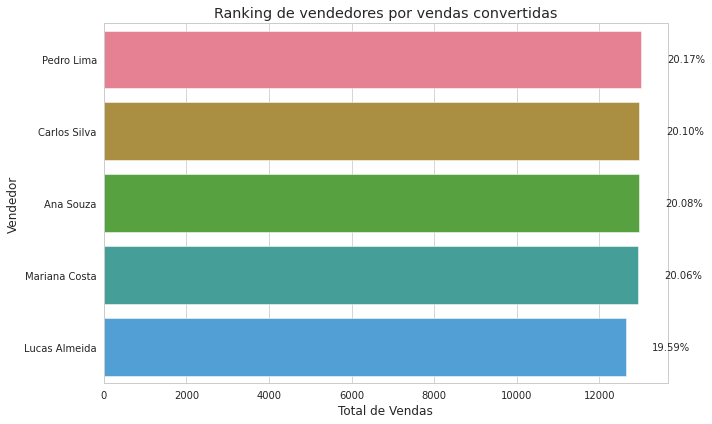

In [0]:
# ===============================
# 📊 Agrupamento e ordenação dos vendedores por total de vendas convertidas
# ===============================
ranking_vendedores = (pedidos_convertidos
    .groupBy("nome_vendedor")
    .agg(F.count("*").alias("total_vendas"))
    .orderBy(F.desc("total_vendas"))
)

# ===============================
# 🔄 Conversão para Pandas para visualização
# ===============================
ranking_vendedores_pd = ranking_vendedores.toPandas()

# ===============================
# 🔢 Cálculo do total geral de vendas para percentual
# ===============================
total_geral = ranking_vendedores_pd["total_vendas"].sum()

# ===============================
# 🎨 Plotagem do gráfico de barras horizontais
# ===============================
plt.figure(figsize=(10, 6))
sns.barplot(x="total_vendas", y="nome_vendedor", data=ranking_vendedores_pd)

plt.title("Ranking de vendedores por vendas convertidas")
plt.xlabel("Total de Vendas")
plt.ylabel("Vendedor")

# ===============================
# 🏷️ Adição dos percentuais ao final das barras
# ===============================
for i, total in enumerate(ranking_vendedores_pd["total_vendas"]):
    perc = (total / total_geral) * 100
    plt.text(total + total_geral * 0.01, i, f'{perc:.2f}%', va='center')

plt.tight_layout()
plt.show()


####Produtos mais rentáveis

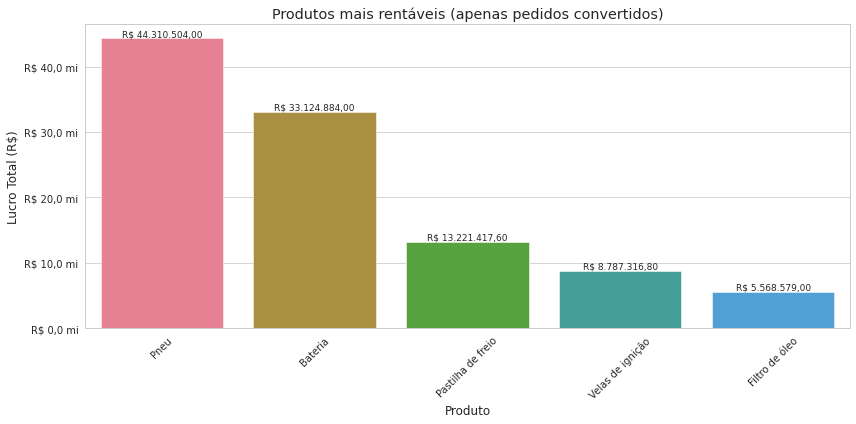

In [0]:
# ===============================
# 🔸 Filtragem de pedidos convertidos
# ===============================
df_convertidos = pedidos_silver.filter(col("status_pedido") == "convertido")

# ===============================
# 💰 Cálculo do lucro por linha de pedido
# ===============================
df_rentabilidade = df_convertidos.withColumn(
    "lucro", col("valor_total_linha") - col("valor_imposto")
)

# ===============================
# 📋 Seleção das colunas necessárias
# ===============================
df_rentabilidade = df_rentabilidade.select("nome_produto", "lucro")

# ===============================
# 📊 Agrupamento por produto e cálculo do lucro total
# ===============================
rentabilidade_por_produto = (df_rentabilidade
    .groupBy("nome_produto")
    .agg(F.sum("lucro").alias("lucro_total"))
    .orderBy(F.desc("lucro_total"))
)

# ===============================
# 🔄 Conversão para Pandas para visualização
# ===============================
rentabilidade_pd = rentabilidade_por_produto.toPandas()

# ===============================
# 🎨 Plotagem do gráfico de barras verticais
# ===============================
plt.figure(figsize=(12, 6))
barplot = sns.barplot(x="nome_produto", y="lucro_total", data=rentabilidade_pd)

plt.title("Produtos mais rentáveis (apenas pedidos convertidos)")
plt.xlabel("Produto")
plt.ylabel("Lucro Total (R$)")
plt.xticks(rotation=45, ha='center')

# ===============================
# 🔧 Formatação do eixo Y para milhões de reais
# ===============================
def formatar_em_milhoes(x, _):
    return f'R$ {x / 1_000_000:,.1f} mi'.replace(",", "X").replace(".", ",").replace("X", ".")

barplot.yaxis.set_major_formatter(ticker.FuncFormatter(formatar_em_milhoes))

# ===============================
# 🔢 Adição dos valores formatados acima das barras
# ===============================
for p in barplot.patches:
    height = p.get_height()
    valor_formatado = f'R$ {height:,.2f}'.replace(",", "X").replace(".", ",").replace("X", ".")
    barplot.annotate(
        valor_formatado,
        (p.get_x() + p.get_width() / 2, height),
        ha='center', va='bottom',
        fontsize=9
    )

plt.tight_layout()
plt.show()


####Série temporal de vendas mês a mês

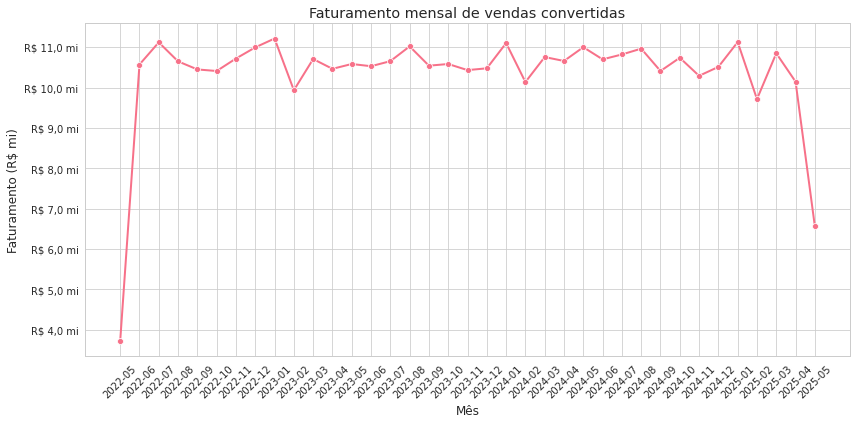

In [0]:
# ===============================
# 🚀 Carregando a tabela do silver
# ===============================
df_vendas = spark.table("silver.notas_fiscais_silver")

# ===============================
# 🔧 Conversão da coluna de data para o formato adequado
# ===============================
df_vendas = df_vendas.withColumn("data_emissao", F.to_date("data_emissao_nf"))

# ===============================
# 📆 Criação da coluna de mês no formato yyyy-MM
# ===============================
df_vendas = df_vendas.withColumn(
    "mes",
    F.date_format("data_emissao", "yyyy-MM")
)

# ===============================
# 📊 Agrupamento por mês e cálculo do faturamento total
# ===============================
vendas_mensal = (df_vendas
    .groupBy("mes")
    .agg(F.sum("valor_total_produto").alias("faturamento_total"))
    .orderBy("mes")
)

# ===============================
# 🔄 Conversão para Pandas para visualização
# ===============================
vendas_mensal_pd = vendas_mensal.toPandas()

# ===============================
# 🎨 Plotagem do gráfico de linha para faturamento mensal
# ===============================
plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")
grafico = sns.lineplot(
    x="mes", 
    y="faturamento_total", 
    data=vendas_mensal_pd, 
    marker="o", 
    linewidth=2
)

# ===============================
# 💰 Formatação do eixo Y em milhões de reais
# ===============================
def formatar_em_milhoes(x, _):
    return f'R$ {x / 1_000_000:,.1f} mi'.replace(",", "X").replace(".", ",").replace("X", ".")

grafico.yaxis.set_major_formatter(ticker.FuncFormatter(formatar_em_milhoes))

# ===============================
# ✨ Ajustes visuais
# ===============================
plt.title("Faturamento mensal de vendas convertidas")
plt.xlabel("Mês")
plt.ylabel("Faturamento (R$ mi)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


####Gráfico de dispersão: quantidade vendida vs lucro

In [0]:
from pyspark.sql.functions import col, sum as Fsum

# ===============================
# 🔎 Filtro: apenas vendas convertidas
# ===============================
df_convertidos = pedidos_silver.filter(col("status_pedido") == "convertido")

# ===============================
# 💰 Cálculo do lucro por linha
# ===============================
df_convertidos = df_convertidos.withColumn(
    "lucro", 
    col("valor_total_linha") - col("valor_imposto")
)

# ===============================
# 📊 Agrupamento por produto: soma de lucro e quantidade
# ===============================
df_agg = df_convertidos.groupBy("nome_produto").agg(
    Fsum("lucro").alias("lucro_total"),
    Fsum("qtde_produtos").alias("quantidade_total")  # ajuste se o nome da coluna for diferente
)

# ===============================
# 🔄 Conversão para Pandas para plotagem
# ===============================
df_agg_pd = df_agg.toPandas()

# Conversão de unidades para melhor visualização
df_agg_pd["lucro_milhoes"] = df_agg_pd["lucro_total"] / 1_000_000
df_agg_pd["quantidade_milhares"] = df_agg_pd["quantidade_total"] / 1_000

# ===============================
# 🎨 Plotagem do gráfico de dispersão
# ===============================
fig = px.scatter(
    df_agg_pd,
    x="lucro_milhoes",
    y="quantidade_milhares",
    color="nome_produto",
    size="lucro_milhoes",
    size_max=30,
    title="Lucro vs Quantidade Vendida por Produto (Pedidos Convertidos)",
    labels={
        "lucro_milhoes": "Lucro Total (milhões R$)",
        "quantidade_milhares": "Quantidade Total Vendida (milhares)",
        "nome_produto": "Produto"
    },
    hover_name="nome_produto"
)

# ===============================
# ✅ Exibição do gráfico
# ===============================
fig.show()


####Tempo médio de faturamento

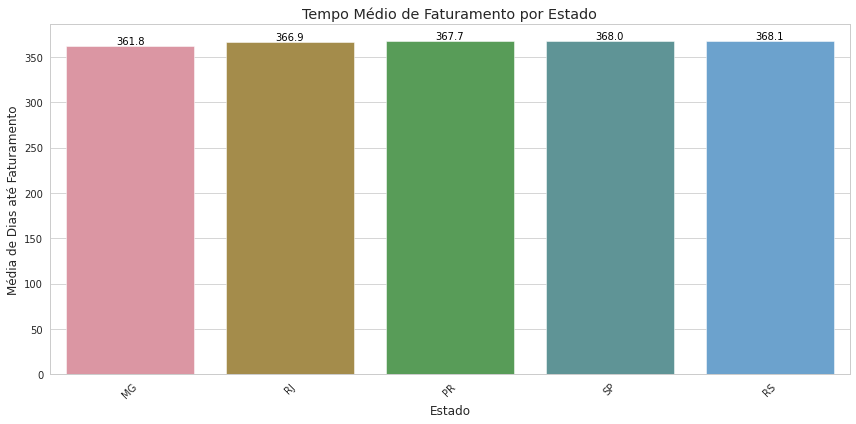

In [0]:
from pyspark.sql.functions import col, to_date, datediff

# ===============================
# 🔎 Filtro: apenas pedidos convertidos
# ===============================
pedidos_convertidos = pedidos_silver.filter(col("status_pedido") == "convertido")

# ===============================
# 🔗 Join com notas fiscais
# ===============================
df_join = notas_fiscais_silver.join(
    pedidos_convertidos,
    notas_fiscais_silver.nr_pedido_referencia == pedidos_convertidos.nr_pedido,
    "inner"
)

# ===============================
# 🗓️ Conversão de colunas para Date
# ===============================
df_join = df_join.withColumn("data_pedido", F.to_date("data_pedido"))
df_join = df_join.withColumn("data_emissao_nf", F.to_date("data_emissao_nf"))

# ===============================
# ✅ Filtro: garantir que data_emissao >= data_pedido
# ===============================
df_join = df_join.filter(col("data_emissao_nf") >= col("data_pedido"))

# ===============================
# ⏱️ Cálculo: diferença de dias até o faturamento
# ===============================
df_join = df_join.withColumn(
    "dias_ate_faturamento", 
    datediff("data_emissao_nf", "data_pedido")
)

# ===============================
# 📊 Agrupamento por estado e cálculo da média
# ===============================
tempo_medio_estado = df_join.groupBy("estado") \
    .agg(F.avg("dias_ate_faturamento").alias("media_dias_faturamento")) \
    .orderBy("media_dias_faturamento")

# ===============================
# 🔄 Conversão para Pandas
# ===============================
tempo_medio_estado_pd = tempo_medio_estado.toPandas()

# ===============================
# 🎨 Paleta personalizada (com base na imagem enviada)
# ===============================
cores_personalizadas = [
    "#e78a9c",  # MG - rosa
    "#b3933c",  # RJ - mostarda
    "#4da74d",  # PR - verde
    "#569c9f",  # SP - azul petróleo
    "#5ca4dd"   # RS - azul claro
]

# ===============================
# 🎨 Plotagem do gráfico de barras com cores fixas
# ===============================
plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")
grafico = sns.barplot(
    data=tempo_medio_estado_pd,
    x="estado",
    y="media_dias_faturamento",
    palette=cores_personalizadas
)

# ===============================
# 🏷️ Adicionando valores no topo de cada barra
# ===============================
for index, row in tempo_medio_estado_pd.iterrows():
    grafico.text(index, row["media_dias_faturamento"] + 2, f"{row['media_dias_faturamento']:.1f}", 
                 color="black", ha="center", fontsize=10)

# ===============================
# ✨ Ajustes visuais
# ===============================
plt.title("Tempo Médio de Faturamento por Estado")
plt.xlabel("Estado")
plt.ylabel("Média de Dias até Faturamento")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


####Produtos mais populares por NFs faturadas

In [0]:
from pyspark.sql.functions import col, countDistinct
import plotly.express as px

# ===============================
# 🔗 JOIN entre notas fiscais e pedidos
# ===============================
df_join = notas_fiscais_silver.alias("nf").join(
    pedidos_silver.alias("ped"),
    col("nf.nr_pedido_referencia") == col("ped.nr_pedido"),
    "inner"
)

# ===============================
# 🔎 Filtro: status 'convertido' ou 'pendente' e excluir nulos
# ===============================
df_filtrado = df_join.filter(
    col("ped.status_pedido").isin("convertido", "pendente") &
    col("nf.nr_nota_fiscal").isNotNull()
)

# ===============================
# 📑 Seleção de colunas relevantes
# ===============================
df_filtrado = df_filtrado.select(
    col("ped.nome_produto").alias("nome_produto"),
    col("nf.nr_nota_fiscal").alias("nr_nota_fiscal")
)

# ===============================
# 📊 Contagem de notas fiscais distintas por produto
# ===============================
contagem_produtos = df_filtrado.groupBy("nome_produto") \
    .agg(countDistinct("nr_nota_fiscal").alias("quantidade_nf")) \
    .orderBy(col("quantidade_nf").desc())

# ===============================
# 🔄 Conversão para Pandas
# ===============================
contagem_pd = contagem_produtos.toPandas()

# ===============================
# ➕ Preparação de colunas auxiliares para visualização
# ===============================
contagem_pd["quantidade_nf_mil"] = contagem_pd["quantidade_nf"] / 1000
contagem_pd["produto_label"] = contagem_pd["nome_produto"] + " (" + contagem_pd["quantidade_nf"].astype(str) + ")"

# ===============================
# 🎨 Escala de cor baseada em azul (#5ca4dd)
# ===============================
escala_azul = [
    "#eaf4fb", 
    "#5ca4dd"   
]

# ===============================
# 🎨 Plotagem do treemap com Plotly e escala em azul
# ===============================
fig = px.treemap(
    contagem_pd,
    path=["produto_label"],
    values="quantidade_nf_mil",
    title="Produtos mais Populares por Quantidade de Notas Fiscais (Convertidos + Pendentes)",
    color="quantidade_nf_mil",  # Escala contínua
    color_continuous_scale=escala_azul
)

# ===============================
# ✍️ Ajuste de rótulos e valores no treemap
# ===============================
fig.update_traces(
    textinfo="label+value",
    branchvalues="total",
    texttemplate='%{label}<br>%{value:.2f}k'
)

# ===============================
# ✅ Exibição do gráfico
# ===============================
fig.show()


/databricks/python/lib/python3.9/site-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

